In [1]:
!pip install essentia
!pip install librosa
!pip install numpy
!pip install matplotlib
!pip install pandas

In [13]:
import librosa
import numpy as np
import matplotlib.pyplot as plt
import essentia
import os
import pandas as pd
import essentia.standard as es

# Audio features:
- Abstraction:
- High level abstraction: key, scale, strength, tempo : understandable for human
- Low-level: amplitude, energy, spectral centroid, spectral flux, zero crossing rate: only understandable for machine

Time_frequency representation: Mel spectrogram


# AUDIO FILE PREPROCESSING
- Resampling: Standardize sampling rates (e.g., 16 kHz).
- Stereo to Mono: Simplify analysis.
- Temporal Alignment: Ensure consistent audio length.
- Silence Removal: Eliminate long silent sections.
- Normalization: Equalize loudness levels.
- Noise Reduction: Remove background noise.




# Resampling
Human hearing capability is between 20hz to 20khz. As the music pieces are self recorded from both amateurs and professionals, we will standardize sampling rates. However, human can still recognize sounds at 44khz, which appear to be very clear and useful for music model.

In [66]:
y,sr = librosa.load('/Users/mp/Desktop/IS/FMAaudio/Blues/Cullah - Open Your Eyes! (To The World).mp3', mono = 1) 
#standardize sampling rate, and ensure monophonic by mono=1

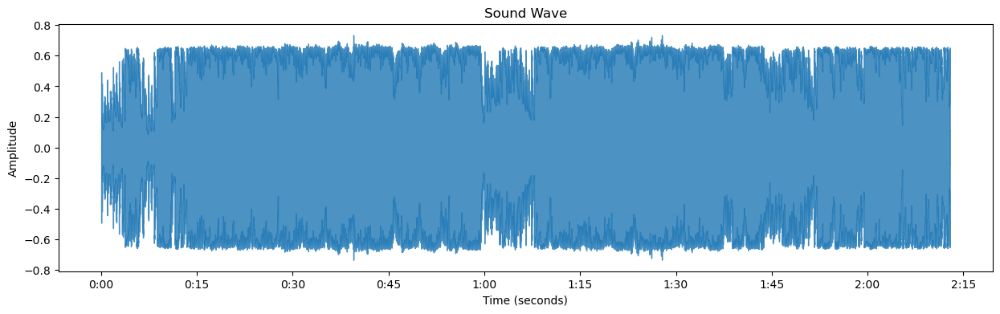

In [46]:
import librosa
import librosa.display
import matplotlib.pyplot as plt

# Load the audio file (replace 'your_audio_file.wav' with your actual file)
file_path = '/Users/mp/Desktop/IS/FMAaudio/Blues/Cullah - Open Your Eyes! (To The World).mp3'
y, sr = librosa.load(file_path, sr=44100)  # Load audio with its original sampling rate

# Create a time axis
time = librosa.times_like(y, sr=sr)

# Plot the waveform
plt.figure(figsize=(15, 4))
librosa.display.waveshow(y, sr=sr, alpha=0.8)
plt.xlabel("Time (seconds)")
plt.ylabel("Amplitude")
plt.title("Sound Wave")
plt.show()


In [7]:
D = librosa.amplitude_to_db(np.abs(librosa.stft(y)), ref=np.max)   #stft helps with noise reduction
librosa.display.specshow(D,x_axis='time', y_axis='mel') #use mel scale

NameError: name 'np' is not defined

# NOISE REDUCTION

In [52]:
!pip install noisereduce
import noisereduce as nr

In [68]:
reduced_noise = nr.reduce_noise(y=y, sr=sr)

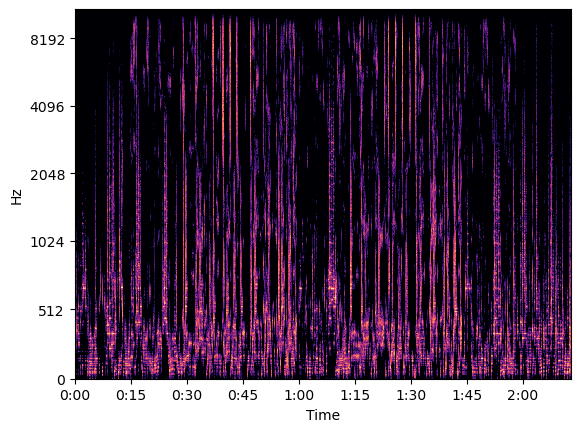

In [70]:
D = librosa.amplitude_to_db(np.abs(librosa.stft(reduced_noise)), ref=np.max)
librosa.display.specshow(D,x_axis='time', y_axis='mel')

For this specific song, noise takes a major part. By the function reduce_noise from noisereduce package, which applied spectral gatting. Assumption: Noise is quieter than the actual signal across most frequency bands. (from owner github)


In [24]:
!pip install pydub

trim the silence

[Text(0.5, 1.0, 'Mel-frequency spectrogram')]

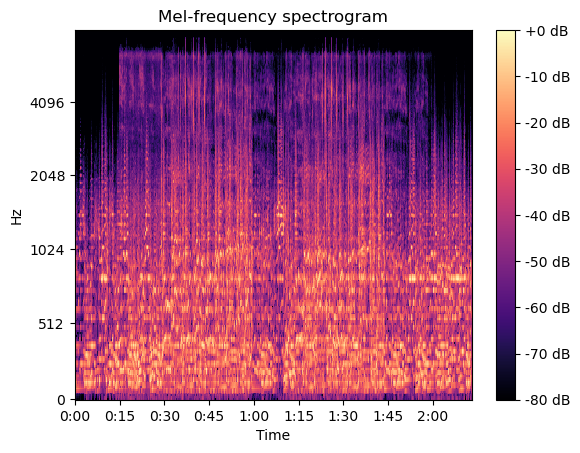

In [23]:
# Mel filters using original sound
S = librosa.feature.melspectrogram(y=y, sr=sr, n_mels=256,
                                    fmax=22050)
fig, ax = plt.subplots()
S_dB = librosa.power_to_db(S, ref=np.max)
img = librosa.display.specshow(S_dB, x_axis='time',
                         y_axis='mel', sr=sr,
                         fmax=8000, ax=ax)
fig.colorbar(img, ax=ax, format='%+2.0f dB')
ax.set(title='Mel-frequency spectrogram')

Spectral flatness (or tonality coefficient) is a measure to quantify how much noise-like a sound is, as opposed to being tone-like 1. A high spectral flatness (closer to 1.0) indicates the spectrum is similar to white noise. It is often converted to decibel.

In [28]:
noise=librosa.feature.spectral_flatness(y=y)
noise

array([[4.1336593e-01, 1.2325378e-04, 1.7174640e-05, ..., 1.7494554e-05,
        7.6875309e-05, 4.9107224e-03]], dtype=float32)

In [29]:
mean=np.mean(noise)
mean

0.0005368784

# test for noise reduction 

In [37]:
audio_signal, sr = librosa.load('/Users/mp/Desktop/IS/FMAaudio/Denoise/Cullah - Open Your Eyes! (To The World).mp3', mono = 1)

# Short-time Fourier Transform (STFT)
stft = librosa.stft(audio_signal)
magnitude, phase = librosa.magphase(stft)

# Estimate noise profile (e.g., from a silent section)
noise_profile = np.mean(magnitude[:,50 :140], axis=1, keepdims=True)

# Subtract noise from magnitude
magnitude_denoised = np.maximum(magnitude - noise_profile, 0)

# Reconstruct the denoised audio
stft_denoised = magnitude_denoised * phase
denoised_signal = librosa.istft(stft_denoised)

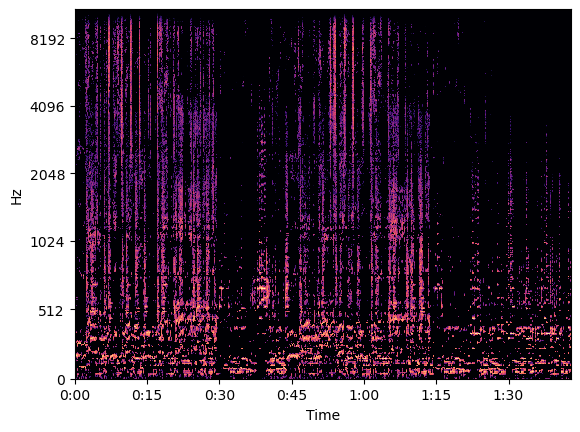

In [39]:
noise_subtract = librosa.amplitude_to_db(np.abs(stft_denoised), ref=np.max)
librosa.display.specshow(noise_subtract,x_axis='time', y_axis='mel')

[Text(0.5, 1.0, 'Mel-frequency spectrogram')]

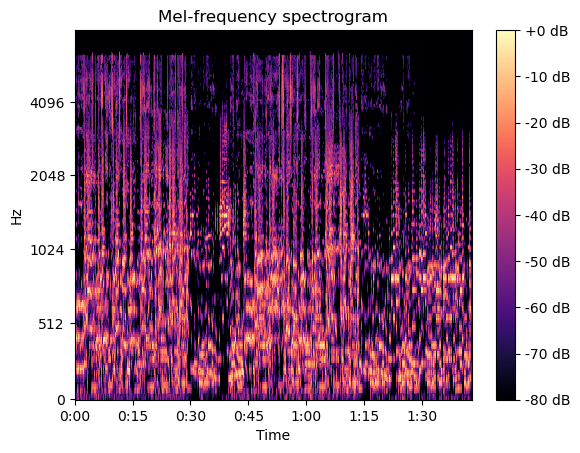

In [41]:
file_path = '/Users/mp/Desktop/IS/FMAaudio/Denoise/Cullah - Open Your Eyes! (To The World).mp3'
y, sr = librosa.load(file_path, sr=None)  # Load audio with its original sampling rate

# Mel filters using original sound
S = librosa.feature.melspectrogram(y=y, sr=sr, n_mels=256,
                                    fmax=22050)
fig, ax = plt.subplots()
S_dB = librosa.power_to_db(S, ref=np.max)
img = librosa.display.specshow(S_dB, x_axis='time',
                         y_axis='mel', sr=sr,
                         fmax=8000, ax=ax)
fig.colorbar(img, ax=ax, format='%+2.0f dB')
ax.set(title='Mel-frequency spectrogram')

this method seems to work better and not reducing too much information

check by converting back to audio 

In [35]:
#mel_spec = librosa.db_to_amplitude(noise_subtract)

# Reconstruct audio
#reconstructed_audio = librosa.feature.inverse.mel_to_audio(mel_spec, sr=sr)

# Optional: Listen to the reconstructed audio
import IPython.display as ipd
ipd.Audio(reduced_noise, rate=sr)
ipd.Audio(denoised_signal, rate = sr)


After testing between spectral gating and noise subtraction, noise substraction seems to work better, as it reduces perceived noise without over-reducing like spectral gating. We will apply this method with all other songs with the window between 1 to 2 mins.

Resampling
Trimming
Noise reduction

In [38]:
!pip install soundfile

# Resample

In [40]:
#resample to sample rate of 44.1k and turn audio into mono instead of stereo
import os
import essentia.standard as es
import soundfile as sf  # Required for saving files

# Define the input and output directories
input_folder = '/Users/mp/Desktop/IS/FMAaudio/All'
output_folder = '/Users/mp/Desktop/IS/FMAaudio/Resampled'

# Ensure the output folder exists
os.makedirs(output_folder, exist_ok=True)

# Iterate over all files in the input folder
for file_name in os.listdir(input_folder):
    file_path = os.path.join(input_folder, file_name)  # Construct full file path
    output_path = os.path.join(output_folder, file_name)  # Construct output file path
    
    try: #test code with errors
        audio_signal, sr = librosa.load(file_path, sr=44100, mono=True)
        print(f"Resampled and saved to: {output_path}") #check
    except Exception as e: #If an error occurs, the program will not crash, it will jump to the except block and execute the code there.
        print(f"Error processing {file_name}: {e}")

Resampled and saved to: /Users/mp/Desktop/IS/FMAaudio/Resampled/Lobo Loco - Blues about Mary Roose (ID 1153).mp3
Resampled and saved to: /Users/mp/Desktop/IS/FMAaudio/Resampled/Raya Brass Band - Banetero Kolo.mp3
Resampled and saved to: /Users/mp/Desktop/IS/FMAaudio/Resampled/Jazzafari - 3 in Raw.mp3
Resampled and saved to: /Users/mp/Desktop/IS/FMAaudio/Resampled/LASERS - Paris.mp3
Resampled and saved to: /Users/mp/Desktop/IS/FMAaudio/Resampled/Tipsy Oxcart - Bairski Vez.mp3
Resampled and saved to: /Users/mp/Desktop/IS/FMAaudio/Resampled/Noise Problems Selections - King of Clubs.mp3
Resampled and saved to: /Users/mp/Desktop/IS/FMAaudio/Resampled/R Frequency - Just Another Day.mp3
Resampled and saved to: /Users/mp/Desktop/IS/FMAaudio/Resampled/Yshwa - Getting Nowhere.mp3
Resampled and saved to: /Users/mp/Desktop/IS/FMAaudio/Resampled/Sapio - Love.mp3
Resampled and saved to: /Users/mp/Desktop/IS/FMAaudio/Resampled/Mahogany Marie - Kick Back.mp3
Resampled and saved to: /Users/mp/Desktop/I

/var/folders/th/5k7whpr96kv8wm7_g1vb5rwm0000gn/T/ipykernel_6089/2816405367.py:19: UserWarning: PySoundFile failed. Trying audioread instead.
  audio_signal, sr = librosa.load(file_path, sr=44100, mono=True)
/opt/anaconda3/lib/python3.12/site-packages/librosa/core/audio.py:184: FutureWarning: librosa.core.audio.__audioread_load
	Deprecated as of librosa version 0.10.0.
	It will be removed in librosa version 1.0.
  y, sr_native = __audioread_load(path, offset, duration, dtype)


Resampled and saved to: /Users/mp/Desktop/IS/FMAaudio/Resampled/Trombone Shorty - On Your Way Down (Live @ KEXP).mp3
Resampled and saved to: /Users/mp/Desktop/IS/FMAaudio/Resampled/Pierce Murphy - Any Single Thing.mp3
Resampled and saved to: /Users/mp/Desktop/IS/FMAaudio/Resampled/Black Sash - You People.mp3
Resampled and saved to: /Users/mp/Desktop/IS/FMAaudio/Resampled/sajua - herbie.mp3
Resampled and saved to: /Users/mp/Desktop/IS/FMAaudio/Resampled/One In A Googolplex - Flowers Tell.mp3
Resampled and saved to: /Users/mp/Desktop/IS/FMAaudio/Resampled/Mavrothi Kontanis - Mild Mannered Rebel - See You Through To The End.mp3
Resampled and saved to: /Users/mp/Desktop/IS/FMAaudio/Resampled/Wintermitts - People Of The Eternal Sun.mp3
Resampled and saved to: /Users/mp/Desktop/IS/FMAaudio/Resampled/human gazpacho - A Storm at Camp.mp3
Resampled and saved to: /Users/mp/Desktop/IS/FMAaudio/Resampled/Mount Carmel - Rooftop.mp3
Resampled and saved to: /Users/mp/Desktop/IS/FMAaudio/Resampled/Cav

[src/libmpg123/id3.c:process_comment():584] error: No comment text / valid description?
[src/libmpg123/id3.c:process_comment():584] error: No comment text / valid description?


Resampled and saved to: /Users/mp/Desktop/IS/FMAaudio/Resampled/HASH - Hurricane.mp3
Resampled and saved to: /Users/mp/Desktop/IS/FMAaudio/Resampled/Baw Tech - Bokosi.mp3.mp3
Resampled and saved to: /Users/mp/Desktop/IS/FMAaudio/Resampled/Beat Mekanik - Old Tyme Shoppe.mp3
Resampled and saved to: /Users/mp/Desktop/IS/FMAaudio/Resampled/JsoundLAB - Soulful Calm Hip Hop.mp3
Resampled and saved to: /Users/mp/Desktop/IS/FMAaudio/Resampled/legacyAlli - Have a Drink and Chill - AM.mp3
Resampled and saved to: /Users/mp/Desktop/IS/FMAaudio/Resampled/Frau - Rat and Cat.mp3
Resampled and saved to: /Users/mp/Desktop/IS/FMAaudio/Resampled/Hector 3 - Summon the Fleet.mp3
Resampled and saved to: /Users/mp/Desktop/IS/FMAaudio/Resampled/The Easton Ellises - Fall For You.mp3
Resampled and saved to: /Users/mp/Desktop/IS/FMAaudio/Resampled/Double-F the King - So Good.mp3
Resampled and saved to: /Users/mp/Desktop/IS/FMAaudio/Resampled/Say Hi - Sister Needs A Settle (Live @ KEXP).mp3
Resampled and saved to

[src/libmpg123/id3.c:process_comment():584] error: No comment text / valid description?
[src/libmpg123/id3.c:process_comment():584] error: No comment text / valid description?


Resampled and saved to: /Users/mp/Desktop/IS/FMAaudio/Resampled/Sapio - Introvert.mp3
Resampled and saved to: /Users/mp/Desktop/IS/FMAaudio/Resampled/mindthings - Eve.mp3
Resampled and saved to: /Users/mp/Desktop/IS/FMAaudio/Resampled/CRUXORIUM - Starlight.mp3
Resampled and saved to: /Users/mp/Desktop/IS/FMAaudio/Resampled/Jon Shuemaker - Paint Me (The Bad Guy).mp3
Resampled and saved to: /Users/mp/Desktop/IS/FMAaudio/Resampled/Arne Bang Huseby - Stormy Blues.mp3
Resampled and saved to: /Users/mp/Desktop/IS/FMAaudio/Resampled/9th Scientist - Verses ft. iLL Chemist.mp3
Resampled and saved to: /Users/mp/Desktop/IS/FMAaudio/Resampled/Roberto Billi - Danza delle stagioni.mp3
Resampled and saved to: /Users/mp/Desktop/IS/FMAaudio/Resampled/Jimmie Oder - Не Уходи.mp3
Resampled and saved to: /Users/mp/Desktop/IS/FMAaudio/Resampled/The Sea Life - Let Me Out.mp3
Resampled and saved to: /Users/mp/Desktop/IS/FMAaudio/Resampled/Double-F the King - Be My Girl.mp3
Resampled and saved to: /Users/mp/De

#one invalid song has been removed --> total of 431 audio files

# Cut off silence

In [43]:
input_folder = '/Users/mp/Desktop/IS/FMAaudio/Resampled'
output_folder = '/Users/mp/Desktop/IS/FMAaudio/Trimmed'
# Iterate over all files in the input folder
for file_name in os.listdir(input_folder):
    file_path = os.path.join(input_folder, file_name)  # Construct the full file path
    output_path = os.path.join(output_folder, file_name)  # Construct the output file path

    try:
        y, sr = librosa.load(file_path, sr=sr)

        # Trim silence from the audio
        trimmed_audio, _ = librosa.effects.trim(y)

        # Save the trimmed audio to the output folder
        sf.write(output_path, trimmed_audio, sr)
        print(f"Trimmed and saved: {file_name}")
    except Exception as e:
        print(f"Error processing {file_name}: {e}")

Trimmed and saved: Lobo Loco - Blues about Mary Roose (ID 1153).mp3
Trimmed and saved: Raya Brass Band - Banetero Kolo.mp3
Trimmed and saved: Jazzafari - 3 in Raw.mp3
Trimmed and saved: LASERS - Paris.mp3
Trimmed and saved: Tipsy Oxcart - Bairski Vez.mp3
Trimmed and saved: Noise Problems Selections - King of Clubs.mp3
Trimmed and saved: R Frequency - Just Another Day.mp3
Trimmed and saved: Yshwa - Getting Nowhere.mp3
Trimmed and saved: Sapio - Love.mp3
Trimmed and saved: Mahogany Marie - Kick Back.mp3
Trimmed and saved: Francesco Lettera - Silence.mp3
Trimmed and saved: Honey Radar - Sick Day #2.mp3
Trimmed and saved: Lonely Kid Quentin Ensemble - L'Ecrivaine.mp3
Trimmed and saved: The Golden Pelicans - Chained to This Dumpster.mp3
Trimmed and saved: Kevin MacLeod - Dirt Rhodes.mp3
Trimmed and saved: Fit and the Conniptions - Fuck And Argue.mp3
Trimmed and saved: SK - SK - Can I live.mp3
Trimmed and saved: Sophia Knapp - Spiderweb.mp3
Trimmed and saved: Proviant Audio - Cigarettes.mp3


/var/folders/th/5k7whpr96kv8wm7_g1vb5rwm0000gn/T/ipykernel_6089/3988136329.py:9: UserWarning: PySoundFile failed. Trying audioread instead.
  y, sr = librosa.load(file_path, sr=sr)
/opt/anaconda3/lib/python3.12/site-packages/librosa/core/audio.py:184: FutureWarning: librosa.core.audio.__audioread_load
	Deprecated as of librosa version 0.10.0.
	It will be removed in librosa version 1.0.
  y, sr_native = __audioread_load(path, offset, duration, dtype)


Trimmed and saved: Trombone Shorty - On Your Way Down (Live @ KEXP).mp3
Trimmed and saved: Pierce Murphy - Any Single Thing.mp3
Trimmed and saved: Black Sash - You People.mp3
Trimmed and saved: sajua - herbie.mp3
Trimmed and saved: One In A Googolplex - Flowers Tell.mp3
Trimmed and saved: Mavrothi Kontanis - Mild Mannered Rebel - See You Through To The End.mp3
Trimmed and saved: Wintermitts - People Of The Eternal Sun.mp3
Trimmed and saved: human gazpacho - A Storm at Camp.mp3
Trimmed and saved: Mount Carmel - Rooftop.mp3
Trimmed and saved: CavalloPazzo - 23 Light Years.mp3
Trimmed and saved: Mc Norman - Why.mp3
Trimmed and saved: Pierce Murphy - Yucatan.mp3
Trimmed and saved: Andrea - Going Down.mp3
Trimmed and saved: The Sea Life - Is It Summit.mp3
Trimmed and saved: Nexto - Show Some Love (It's Christmas).mp3
Trimmed and saved: SUPERARE - Vows.mp3
Trimmed and saved: Kellee Maize - 2012.mp3
Trimmed and saved: Daddy Long Legs - Blood From A Stone.mp3
Trimmed and saved: Double-F the Ki

# Zoom: Focus on only second 0:30 to 2:15
Audio libraries (Librosa, Essentia) work with sample arrays, not time units.
-  slicing (audio[startsample:endsample]) require indices samples because audio is a discrete signal.

In [45]:
input_folder = '/Users/mp/Desktop/IS/FMAaudio/Trimmed'
output_folder = '/Users/mp/Desktop/IS/FMAaudio/Zoomed'

start = 30       
end= 135 

for file_name in os.listdir(input_folder):
    file_path = os.path.join(input_folder, file_name)  # Construct the full file path
    output_path = os.path.join(output_folder, file_name)  # Construct the output file path

    try:
        y, sr = librosa.load(file_path, sr=sr)

        # Zoomed audio
        zoomed_audio = y[start*sr:end*sr]

        # Save the zoomed audio to the output folder
        sf.write(output_path, zoomed_audio, sr)
        print(f"Zoomed and saved: {file_name}")
    except Exception as e:
        print(f"Error processing {file_name}: {e}")

Zoomed and saved: Lobo Loco - Blues about Mary Roose (ID 1153).mp3
Zoomed and saved: Raya Brass Band - Banetero Kolo.mp3
Zoomed and saved: Jazzafari - 3 in Raw.mp3
Zoomed and saved: LASERS - Paris.mp3
Zoomed and saved: Tipsy Oxcart - Bairski Vez.mp3
Zoomed and saved: Noise Problems Selections - King of Clubs.mp3
Zoomed and saved: R Frequency - Just Another Day.mp3
Zoomed and saved: Yshwa - Getting Nowhere.mp3
Zoomed and saved: Sapio - Love.mp3
Zoomed and saved: Mahogany Marie - Kick Back.mp3
Zoomed and saved: Francesco Lettera - Silence.mp3
Zoomed and saved: Honey Radar - Sick Day #2.mp3
Zoomed and saved: Lonely Kid Quentin Ensemble - L'Ecrivaine.mp3
Zoomed and saved: The Golden Pelicans - Chained to This Dumpster.mp3
Zoomed and saved: Kevin MacLeod - Dirt Rhodes.mp3
Zoomed and saved: Fit and the Conniptions - Fuck And Argue.mp3
Zoomed and saved: SK - SK - Can I live.mp3
Zoomed and saved: Sophia Knapp - Spiderweb.mp3
Zoomed and saved: Proviant Audio - Cigarettes.mp3
Zoomed and saved: L

Another type of normalization is based on a measure of loudness, wherein the gain is changed to bring the average loudness to a target level. This average may be approximate, such as a simple measurement of average power (e.g. RMS), or more accurate, such as a measure that addresses human perception e.g. that defined by EBU R128 and offered by ReplayGain, Sound Check and GoldWave. (WIKI: https://en.wikipedia.org/wiki/Audio_normalization)

In [47]:
input_folder = '/Users/mp/Desktop/IS/FMAaudio/Zoomed'
output_folder = '/Users/mp/Desktop/IS/FMAaudio/Normalized'

#Measure the loudness for all files
rms_values = []  # To store RMS values of each file
file_rms = {}    # Dictionary to store file-wise RMS values for reference

for file_name in os.listdir(input_folder):
    file_path = os.path.join(input_folder, file_name)    
    try:
        # Load the audio file
        loader = es.MonoLoader(filename=file_path)
        audio = loader()

        # Calculate RMS value of the audio
        rms = np.sqrt(np.mean(audio**2))  # RMS formula
        rms_values.append(rms)
        file_rms[file_name] = rms

    except Exception as e:
        print(f"Error calculating RMS for {file_name}: {e}")

In [1]:
# Calculate median rms
median_rms = np.median(rms_values)
median_rms


NameError: name 'np' is not defined

In [49]:
# Normalize each song to the median rms
for file_name, rms in file_rms.items():
    file_path = os.path.join(input_folder, file_name)
    output_path = os.path.join(output_folder, file_name)

    try:
        # Load the audio file
        loader = es.MonoLoader(filename=file_path)
        audio = loader()

        # Calculate the gain needed to match the median RMS
        gain = median_rms / rms  # Linear scaling factor

        # Apply the gain to normalize RMS
        normalized_audio = audio * gain

        # Save the normalized audio
        sf.write(output_path, normalized_audio, int(loader.paramValue('sampleRate')))
        print(f"RMS normalized to median for {file_name} (scaling factor: {gain:.4f})")

    except Exception as e:
        print(f"Error normalizing {file_name}: {e}")


RMS normalized to median for Lobo Loco - Blues about Mary Roose (ID 1153).mp3 (scaling factor: 1.6366)
RMS normalized to median for Raya Brass Band - Banetero Kolo.mp3 (scaling factor: 0.6361)
RMS normalized to median for Jazzafari - 3 in Raw.mp3 (scaling factor: 0.6950)
RMS normalized to median for LASERS - Paris.mp3 (scaling factor: 1.0421)
RMS normalized to median for Tipsy Oxcart - Bairski Vez.mp3 (scaling factor: 1.6486)
RMS normalized to median for Noise Problems Selections - King of Clubs.mp3 (scaling factor: 1.5717)
RMS normalized to median for R Frequency - Just Another Day.mp3 (scaling factor: 1.0458)
RMS normalized to median for Yshwa - Getting Nowhere.mp3 (scaling factor: 0.6682)
RMS normalized to median for Sapio - Love.mp3 (scaling factor: 0.9592)
RMS normalized to median for Mahogany Marie - Kick Back.mp3 (scaling factor: 2.0098)
RMS normalized to median for Francesco Lettera - Silence.mp3 (scaling factor: 2.9006)
RMS normalized to median for Honey Radar - Sick Day #2.mp

# Denoise

In [51]:
input_folder = '/Users/mp/Desktop/IS/FMAaudio/Normalized'
output_folder = '/Users/mp/Desktop/IS/FMAaudio/Denoise'
for file_name in os.listdir(input_folder):
    file_path = os.path.join(input_folder, file_name)
    output_path = os.path.join(output_folder, file_name)

    try:
        audio_signal, sr = librosa.load(file_path, sr=None, mono=1)


        # Short-time Fourier Transform (STFT)
        stft = librosa.stft(audio_signal)
        magnitude, phase = librosa.magphase(stft)

        # Estimate noise profile (e.g., from a silent section)
        noise_profile = np.mean(magnitude[:, :], axis=1, keepdims=True)

        # Subtract noise from the magnitude
        magnitude_denoised = np.maximum(magnitude - noise_profile, 0)

        # Reconstruct the denoised audio
        stft_denoised = magnitude_denoised * phase
        denoised_signal = librosa.istft(stft_denoised)

        # Save the denoised audio
        sf.write(output_path, denoised_signal, sr)
        print(f"Denoised and saved: {file_name}")

    except Exception as e:
        print(f"Error processing {file_name}: {e}")

Denoised and saved: Lobo Loco - Blues about Mary Roose (ID 1153).mp3
Denoised and saved: Raya Brass Band - Banetero Kolo.mp3
Denoised and saved: Jazzafari - 3 in Raw.mp3
Denoised and saved: LASERS - Paris.mp3
Denoised and saved: Tipsy Oxcart - Bairski Vez.mp3
Denoised and saved: Noise Problems Selections - King of Clubs.mp3
Denoised and saved: R Frequency - Just Another Day.mp3
Denoised and saved: Yshwa - Getting Nowhere.mp3
Denoised and saved: Sapio - Love.mp3
Denoised and saved: Mahogany Marie - Kick Back.mp3
Denoised and saved: Francesco Lettera - Silence.mp3
Denoised and saved: Honey Radar - Sick Day #2.mp3
Denoised and saved: Lonely Kid Quentin Ensemble - L'Ecrivaine.mp3
Denoised and saved: The Golden Pelicans - Chained to This Dumpster.mp3
Denoised and saved: Kevin MacLeod - Dirt Rhodes.mp3
Denoised and saved: Fit and the Conniptions - Fuck And Argue.mp3
Denoised and saved: SK - SK - Can I live.mp3
Denoised and saved: Sophia Knapp - Spiderweb.mp3
Denoised and saved: Proviant Audi

# Create Mel-spectrogram and turn to array, saving in a list

In [53]:
#input_folder = '/Users/mp/Desktop/IS/FMAaudio/Denoise'
#output_folder = '/Users/mp/Desktop/IS/FMAaudio/'
#for file_name in os.listdir(input_folder):
#    file_path = os.path.join(input_folder, file_name)
#    output_path = os.path.join(output_folder, file_name)
    
#    audio_signal, sr = librosa.load(file_path, sr=None, mono=1)
    
#    try:
#    D= librosa.amplitude_to_db(np.abs(librosa.stft(audio_signal)), ref=np.max)   #stft helps with noise reduction
#    S= librosa.display.specshow(D,x_axis='time', y_axis='mel') #use mel scale

    

In [75]:
import os
import numpy as np
import librosa
import essentia.standard as es

# Define input and output directories
input_folder = '/Users/mp/Desktop/IS/FMAaudio/Denoise'
output_folder = '/Users/mp/Desktop/IS/FMAaudio/Combined'

# Ensure the output directory exists
os.makedirs(output_folder, exist_ok=True)

dataset = []  # List to store all processed features

# Iterate over all files in the input folder
for file_name in os.listdir(input_folder):
    # Ensure only `.mp3` files are processed
    if not file_name.endswith('.mp3'):
        print(f"Skipping non-mp3 file: {file_name}")
        continue

    file_path = os.path.join(input_folder, file_name)

    try:
        # Load the audio using Essentia's MonoLoader
        loader = es.MonoLoader(filename=file_path)
        audio = loader()
        sr = loader.paramValue('sampleRate')  # Get the sample rate

        # Mel spectrogram
        mel_spec = librosa.feature.melspectrogram(y=audio, sr=22050, n_mels=128,hop_length=1024 )
        mel_spec_db = librosa.power_to_db(mel_spec, ref=np.max)
        mel_vector = mel_spec_db.flatten()  # Flatten the Mel spectrogram into a 1D vector
  
        # Extract Tempo (BPM) using Essentia
        rhythm_extractor = es.RhythmExtractor2013(method="multifeature")
        bpm, _, _, _, _ = rhythm_extractor(audio)

        # Extract Key, Scale, and Strength using Essentia
        key_extractor = es.KeyExtractor()
        key, scale, strength = key_extractor(audio)

        # Combine all features into a dictionary
        features = {
            "file_name": file_name,
            "bpm": bpm,
            "key": key,
            "scale": scale,
            "key_strength": strength,
            "mel_vector": mel_vector  # Store the flattened Mel spectrogram vector
        }
        dataset.append(features)

        print(f"Successfully processed: {file_name}")

    except Exception as e:
        print(f"Error processing {file_name}: {e}")


Successfully processed: Lobo Loco - Blues about Mary Roose (ID 1153).mp3
Successfully processed: Raya Brass Band - Banetero Kolo.mp3
Successfully processed: Jazzafari - 3 in Raw.mp3
Successfully processed: LASERS - Paris.mp3
Successfully processed: Tipsy Oxcart - Bairski Vez.mp3
Successfully processed: Noise Problems Selections - King of Clubs.mp3
Successfully processed: R Frequency - Just Another Day.mp3
Successfully processed: Yshwa - Getting Nowhere.mp3
Successfully processed: Sapio - Love.mp3
Successfully processed: Mahogany Marie - Kick Back.mp3
Successfully processed: Francesco Lettera - Silence.mp3
Successfully processed: Honey Radar - Sick Day #2.mp3
Successfully processed: Lonely Kid Quentin Ensemble - L'Ecrivaine.mp3
Successfully processed: The Golden Pelicans - Chained to This Dumpster.mp3
Successfully processed: Kevin MacLeod - Dirt Rhodes.mp3
Successfully processed: Fit and the Conniptions - Fuck And Argue.mp3
Successfully processed: SK - SK - Can I live.mp3
Successfully p

In [77]:
type(dataset)

list

In [81]:
#convert to panda dataframe
SPmood = pd.DataFrame(dataset)
SPmood


,file_name,bpm,key,scale,key_strength,mel_vector
0,Lobo Loco - Blues about Mary Roose (ID 1153).mp3,136.496384,D,minor,0.857395,"[-54.037674, -57.166718, -59.026573, -55.1363,..."
1,Raya Brass Band - Banetero Kolo.mp3,163.957520,F,major,0.691950,"[-38.56755, -39.3003, -26.486628, -17.95028, -..."
2,Jazzafari - 3 in Raw.mp3,124.108849,F#,minor,0.795335,"[-17.787302, -12.299484, -14.487415, -26.54537..."
3,LASERS - Paris.mp3,140.006027,F,major,0.877331,"[-33.98225, -33.076958, -39.938587, -47.852196..."
4,Tipsy Oxcart - Bairski Vez.mp3,96.518738,D,minor,0.860609,"[-20.63337, -12.989651, -13.519527, -14.349524..."
...,...,...,...,...,...,...
426,Double-F the King - Dodo.mp3,112.639099,Ab,minor,0.889024,"[-18.827925, -25.420973, -36.458878, -23.00911..."
427,Jon Shuemaker - City of the Sun.mp3,129.622253,D,minor,0.757552,"[-58.46074, -75.745544, -80.0, -80.0, -80.0, -..."
428,ish10 yow1r0 - the white feathers of a little ...,139.661774,C,minor,0.743649,"[-14.860222, -8.845776, -7.3702717, -7.4669533..."
429,Till Paradiso - Friends will be Friends (TP 70...,129.799957,F,minor,0.809095,"[-48.618004, -45.304626, -47.979183, -46.861, ..."


In [87]:
# Assuming SPmood is the DataFrame you already have
# Add a new column for spectral centroid
spectral_centroids = []

input_folder = '/Users/mp/Desktop/IS/FMAaudio/Denoise'

# Iterate over files in the DataFrame
for index, row in SPmood.iterrows():
    file_name = row['file_name']
    file_path = os.path.join(input_folder, file_name)

    try:
        # Load the audio
        audio_signal, sr = librosa.load(file_path, sr=None, mono=True)

        # Calculate the spectral centroid
        centroid = librosa.feature.spectral_centroid(y=audio_signal, sr=sr)

        # Use the mean spectral centroid as the representative value for the file
        mean_centroid = np.mean(centroid)

        # Append to the list
        spectral_centroids.append(mean_centroid)

    except Exception as e:
        print(f"Error processing {file_name}: {e}")
        spectral_centroids.append(None)  # Append None for failed files

# Add the spectral centroid column to the DataFrame
SPmood['spectral_centroid'] = spectral_centroids

# Inspect the updated DataFrame
print(SPmood.head())


                                          file_name         bpm key  scale  \
0  Lobo Loco - Blues about Mary Roose (ID 1153).mp3  136.496384   D  minor   
1               Raya Brass Band - Banetero Kolo.mp3  163.957520   F  major   
2                          Jazzafari - 3 in Raw.mp3  124.108849  F#  minor   
3                                LASERS - Paris.mp3  140.006027   F  major   
4                    Tipsy Oxcart - Bairski Vez.mp3   96.518738   D  minor   

   key_strength                                         mel_vector  \
0      0.857395  [-54.037674, -57.166718, -59.026573, -55.1363,...   
1      0.691950  [-38.56755, -39.3003, -26.486628, -17.95028, -...   
2      0.795335  [-17.787302, -12.299484, -14.487415, -26.54537...   
3      0.877331  [-33.98225, -33.076958, -39.938587, -47.852196...   
4      0.860609  [-20.63337, -12.989651, -13.519527, -14.349524...   

   spectral_centroid  
0        1362.012894  
1        2397.921051  
2        4164.553630  
3        2470.4893

In [89]:
type(SPmood)

pandas.core.frame.DataFrame

In [91]:
type(SPmood)
SPmood

,file_name,bpm,key,scale,key_strength,mel_vector,spectral_centroid
0,Lobo Loco - Blues about Mary Roose (ID 1153).mp3,136.496384,D,minor,0.857395,"[-54.037674, -57.166718, -59.026573, -55.1363,...",1362.012894
1,Raya Brass Band - Banetero Kolo.mp3,163.957520,F,major,0.691950,"[-38.56755, -39.3003, -26.486628, -17.95028, -...",2397.921051
2,Jazzafari - 3 in Raw.mp3,124.108849,F#,minor,0.795335,"[-17.787302, -12.299484, -14.487415, -26.54537...",4164.553630
3,LASERS - Paris.mp3,140.006027,F,major,0.877331,"[-33.98225, -33.076958, -39.938587, -47.852196...",2470.489356
4,Tipsy Oxcart - Bairski Vez.mp3,96.518738,D,minor,0.860609,"[-20.63337, -12.989651, -13.519527, -14.349524...",2448.152327
...,...,...,...,...,...,...,...
426,Double-F the King - Dodo.mp3,112.639099,Ab,minor,0.889024,"[-18.827925, -25.420973, -36.458878, -23.00911...",3506.779658
427,Jon Shuemaker - City of the Sun.mp3,129.622253,D,minor,0.757552,"[-58.46074, -75.745544, -80.0, -80.0, -80.0, -...",2502.325830
428,ish10 yow1r0 - the white feathers of a little ...,139.661774,C,minor,0.743649,"[-14.860222, -8.845776, -7.3702717, -7.4669533...",1373.575122
429,Till Paradiso - Friends will be Friends (TP 70...,129.799957,F,minor,0.809095,"[-48.618004, -45.304626, -47.979183, -46.861, ...",2953.987867


In [93]:
len(SPmood['mel_vector'].iloc[0])

578816

In [90]:
#SPmood.to_pickle("SPmood.pkl")
#SPmood = pd.read_pickle("SPmood.pkl")


In [31]:
#SPmood = pd.read_pickle("SPmood.pkl")
#SPmood

In [95]:
SPmood

,file_name,bpm,key,scale,key_strength,mel_vector,spectral_centroid
0,Lobo Loco - Blues about Mary Roose (ID 1153).mp3,136.496384,D,minor,0.857395,"[-54.037674, -57.166718, -59.026573, -55.1363,...",1362.012894
1,Raya Brass Band - Banetero Kolo.mp3,163.957520,F,major,0.691950,"[-38.56755, -39.3003, -26.486628, -17.95028, -...",2397.921051
2,Jazzafari - 3 in Raw.mp3,124.108849,F#,minor,0.795335,"[-17.787302, -12.299484, -14.487415, -26.54537...",4164.553630
3,LASERS - Paris.mp3,140.006027,F,major,0.877331,"[-33.98225, -33.076958, -39.938587, -47.852196...",2470.489356
4,Tipsy Oxcart - Bairski Vez.mp3,96.518738,D,minor,0.860609,"[-20.63337, -12.989651, -13.519527, -14.349524...",2448.152327
...,...,...,...,...,...,...,...
426,Double-F the King - Dodo.mp3,112.639099,Ab,minor,0.889024,"[-18.827925, -25.420973, -36.458878, -23.00911...",3506.779658
427,Jon Shuemaker - City of the Sun.mp3,129.622253,D,minor,0.757552,"[-58.46074, -75.745544, -80.0, -80.0, -80.0, -...",2502.325830
428,ish10 yow1r0 - the white feathers of a little ...,139.661774,C,minor,0.743649,"[-14.860222, -8.845776, -7.3702717, -7.4669533...",1373.575122
429,Till Paradiso - Friends will be Friends (TP 70...,129.799957,F,minor,0.809095,"[-48.618004, -45.304626, -47.979183, -46.861, ...",2953.987867


In [97]:
print(SPmood['mel_vector'].iloc[0][:1000])  # Prints first 10 elements

[-54.037674 -57.166718 -59.026573 -55.1363   -50.908875 -64.82768
 -58.468765 -65.96475  -66.39763  -71.77835  -71.3768   -67.50145
 -69.8532   -76.69542  -80.       -55.014988 -52.281563 -51.92
 -53.551678 -56.580154 -52.781826 -64.95094  -52.08734  -60.744247
 -66.88629  -70.06668  -72.507965 -71.21822  -70.3127   -74.40219
 -71.15535  -71.41709  -72.69184  -75.307175 -67.96531  -70.90253
 -68.61156  -70.00455  -71.54438  -72.047195 -65.3639   -62.196384
 -53.222916 -54.073997 -52.80057  -55.160282 -52.772507 -53.26461
 -50.86304  -52.116623 -50.63069  -49.769966 -54.166058 -46.630135
 -50.112625 -60.628834 -71.09729  -72.27757  -71.38846  -66.274414
 -67.84951  -76.57495  -80.       -76.120476 -68.4488   -69.05191
 -72.74286  -69.97878  -77.64632  -70.27663  -68.067116 -73.2836
 -66.60018  -63.199486 -63.98713  -62.562965 -56.96943  -63.703583
 -59.919743 -60.413734 -43.68242  -46.055    -51.06322  -63.67222
 -63.63029  -64.29839  -74.53068  -77.683365 -80.       -54.437096
 -55.018

In [ ]:
results = [SPmood['mel_vector'][0]]  # Initialize with first entry
for i in range(430):
    print(SPmood['mel_vector'][i].shape)

    if SPmood['mel_vector'][i].shape[0] == 578816:
        results = np.append(results, [SPmood['mel_vector'][i]], axis=0)


In [136]:
results2 = [SPmood['mel_vector'].iloc[0]]  # Initialize with first entry

for i in range(430):
    print(SPmood['mel_vector'].iloc[i].shape)

    if SPmood['mel_vector'].iloc[i].shape[0] == 578816:
        results = np.append(results, [SPmood['mel_vector'].iloc[i]], axis=0)
    else:
        print(SPmood['file_name'].iloc[i])  # Use `.iloc[]` to avoid KeyError


(578816,)
(578816,)
(578816,)
(578816,)
(578816,)
(578816,)
(578816,)
(578816,)
(363648,)
Sapio - Love.mp3
(578816,)
(578816,)
(170880,)
Honey Radar - Sick Day #2.mp3
(578816,)
(578816,)
(480512,)
Kevin MacLeod - Dirt Rhodes.mp3
(578816,)
(575232,)
SK - SK - Can I live.mp3
(578816,)
(578816,)
(578816,)
(578816,)
(578816,)
(578816,)
(578816,)
(578816,)
(578816,)
(578816,)
(578816,)
(578816,)
(578816,)
(578816,)
(578816,)
(578816,)
(578816,)
(578816,)
(578816,)
(578816,)
(578816,)
(578816,)
(578816,)
(578816,)
(578816,)
(578816,)
(578816,)
(578816,)
(578816,)
(369408,)
Serge Quadrado - Web Building.mp3
(567424,)
Cullah - Open Your Eyes! (To The World).mp3
(578816,)
(578816,)
(578816,)
(578816,)
(578816,)
(578816,)
(578816,)
(578816,)
(578816,)
(578816,)
(578816,)
(578816,)
(578816,)
(578816,)
(578816,)
(578816,)
(578816,)
(578816,)
(578816,)
(578816,)
(578816,)
(578816,)
(578816,)
(503552,)
Nexto - Show Some Love (It's Christmas).mp3
(394880,)
SUPERARE - Vows.mp3
(578816,)
(578816,)
(578

In [103]:
#result = np.append([SPmood['mel_vector'][1]], [SPmood['mel_vector'][2]], axis =0)
results.shape

(389, 578816)

In [105]:
import numpy
numpy.savetxt("foo.csv", results, delimiter=",")

In [123]:
df = pd.read_csv("foo.csv", nrows=10, header=None)
print(df)


      0          1          2          3          4          5       \
0 -54.037674 -57.166718 -59.026573 -55.136299 -50.908875 -64.827682   
1 -54.037674 -57.166718 -59.026573 -55.136299 -50.908875 -64.827682   
2 -38.567551 -39.300301 -26.486628 -17.950279 -25.643404 -24.181005   
3 -17.787302 -12.299484 -14.487415 -26.545372 -28.548450 -32.060593   
4 -33.982250 -33.076958 -39.938587 -47.852196 -60.408737 -80.000000   
5 -20.633369 -12.989651 -13.519527 -14.349524 -12.611603 -14.628361   
6 -28.244646 -17.557428  -2.808308  -5.354530 -17.476582 -31.205454   
7 -74.134521 -80.000000 -80.000000 -80.000000 -80.000000 -80.000000   
8 -66.237679 -80.000000 -80.000000 -77.189056 -32.947273 -10.828478   
9 -41.686699 -42.908237 -43.951782 -44.858101 -46.142017 -47.133812   

      6          7          8          9       ...  578806  578807  578808  \
0 -58.468765 -65.964752 -66.397629 -71.778351  ...   -80.0   -80.0   -80.0   
1 -58.468765 -65.964752 -66.397629 -71.778351  ...   -80.0   -

In [ ]:
!pip install scikit-fuzzy


In [ ]:
!pip install scikit-learn

In [13]:
!pip install tensorflow

In [138]:
SPmood

,file_name,bpm,key,scale,key_strength,mel_vector,spectral_centroid
0,Lobo Loco - Blues about Mary Roose (ID 1153).mp3,136.496384,D,minor,0.857395,"[-54.037674, -57.166718, -59.026573, -55.1363,...",1362.012894
1,Raya Brass Band - Banetero Kolo.mp3,163.957520,F,major,0.691950,"[-38.56755, -39.3003, -26.486628, -17.95028, -...",2397.921051
2,Jazzafari - 3 in Raw.mp3,124.108849,F#,minor,0.795335,"[-17.787302, -12.299484, -14.487415, -26.54537...",4164.553630
3,LASERS - Paris.mp3,140.006027,F,major,0.877331,"[-33.98225, -33.076958, -39.938587, -47.852196...",2470.489356
4,Tipsy Oxcart - Bairski Vez.mp3,96.518738,D,minor,0.860609,"[-20.63337, -12.989651, -13.519527, -14.349524...",2448.152327
...,...,...,...,...,...,...,...
426,Double-F the King - Dodo.mp3,112.639099,Ab,minor,0.889024,"[-18.827925, -25.420973, -36.458878, -23.00911...",3506.779658
427,Jon Shuemaker - City of the Sun.mp3,129.622253,D,minor,0.757552,"[-58.46074, -75.745544, -80.0, -80.0, -80.0, -...",2502.325830
428,ish10 yow1r0 - the white feathers of a little ...,139.661774,C,minor,0.743649,"[-14.860222, -8.845776, -7.3702717, -7.4669533...",1373.575122
429,Till Paradiso - Friends will be Friends (TP 70...,129.799957,F,minor,0.809095,"[-48.618004, -45.304626, -47.979183, -46.861, ...",2953.987867


In [146]:
len(SPmood['mel_vector'][0])

578816

In [233]:
import pandas as pd

# Load the Excel file
excel_df = pd.read_excel("Label.xlsx")  # Change filename as needed

# Display first few rows
print(excel_df.head())


                                           file_name mood
0                           1st Contact - Nur Du.mp3   RM
1                      1st Contact - Rim Of Time.mp3   EH
2  6th Sense &amp; Mick Boogie - Wildahead Portib...   EH
3                9th Scientist - Do You Love Me_.mp3   EH
4         9th Scientist - Verses ft. iLL Chemist.mp3   EM


In [393]:
data = SPmood.merge(excel_df, on="file_name", how="inner")  # Use "left" if needed

# Show merged dataset
print(data.head())


                                          file_name         bpm key  scale  \
0  Lobo Loco - Blues about Mary Roose (ID 1153).mp3  136.496384   D  minor   
1               Raya Brass Band - Banetero Kolo.mp3  163.957520   F  major   
2                          Jazzafari - 3 in Raw.mp3  124.108849  F#  minor   
3                                LASERS - Paris.mp3  140.006027   F  major   
4                    Tipsy Oxcart - Bairski Vez.mp3   96.518738   D  minor   

   key_strength                                         mel_vector  \
0      0.857395  [-54.037674, -57.166718, -59.026573, -55.1363,...   
1      0.691950  [-38.56755, -39.3003, -26.486628, -17.95028, -...   
2      0.795335  [-17.787302, -12.299484, -14.487415, -26.54537...   
3      0.877331  [-33.98225, -33.076958, -39.938587, -47.852196...   
4      0.860609  [-20.63337, -12.989651, -13.519527, -14.349524...   

   spectral_centroid mood  
0        1362.012894   RM  
1        2397.921051   EH  
2        4164.553630   EH 

In [395]:
data

,file_name,bpm,key,scale,key_strength,mel_vector,spectral_centroid,mood
0,Lobo Loco - Blues about Mary Roose (ID 1153).mp3,136.496384,D,minor,0.857395,"[-54.037674, -57.166718, -59.026573, -55.1363,...",1362.012894,RM
1,Raya Brass Band - Banetero Kolo.mp3,163.957520,F,major,0.691950,"[-38.56755, -39.3003, -26.486628, -17.95028, -...",2397.921051,EH
2,Jazzafari - 3 in Raw.mp3,124.108849,F#,minor,0.795335,"[-17.787302, -12.299484, -14.487415, -26.54537...",4164.553630,EH
3,LASERS - Paris.mp3,140.006027,F,major,0.877331,"[-33.98225, -33.076958, -39.938587, -47.852196...",2470.489356,RM
4,Tipsy Oxcart - Bairski Vez.mp3,96.518738,D,minor,0.860609,"[-20.63337, -12.989651, -13.519527, -14.349524...",2448.152327,EH
...,...,...,...,...,...,...,...,...
383,Double-F the King - Dodo.mp3,112.639099,Ab,minor,0.889024,"[-18.827925, -25.420973, -36.458878, -23.00911...",3506.779658,EM
384,Jon Shuemaker - City of the Sun.mp3,129.622253,D,minor,0.757552,"[-58.46074, -75.745544, -80.0, -80.0, -80.0, -...",2502.325830,EM
385,ish10 yow1r0 - the white feathers of a little ...,139.661774,C,minor,0.743649,"[-14.860222, -8.845776, -7.3702717, -7.4669533...",1373.575122,RM
386,Till Paradiso - Friends will be Friends (TP 70...,129.799957,F,minor,0.809095,"[-48.618004, -45.304626, -47.979183, -46.861, ...",2953.987867,RH


In [397]:
data.to_pickle("finaldata.pkl")

final = pd.read_pickle("finaldata.pkl")
final.head()

,file_name,bpm,key,scale,key_strength,mel_vector,spectral_centroid,mood
0,Lobo Loco - Blues about Mary Roose (ID 1153).mp3,136.496384,D,minor,0.857395,"[-54.037674, -57.166718, -59.026573, -55.1363,...",1362.012894,RM
1,Raya Brass Band - Banetero Kolo.mp3,163.957520,F,major,0.691950,"[-38.56755, -39.3003, -26.486628, -17.95028, -...",2397.921051,EH
2,Jazzafari - 3 in Raw.mp3,124.108849,F#,minor,0.795335,"[-17.787302, -12.299484, -14.487415, -26.54537...",4164.553630,EH
3,LASERS - Paris.mp3,140.006027,F,major,0.877331,"[-33.98225, -33.076958, -39.938587, -47.852196...",2470.489356,RM
4,Tipsy Oxcart - Bairski Vez.mp3,96.518738,D,minor,0.860609,"[-20.63337, -12.989651, -13.519527, -14.349524...",2448.152327,EH


In [245]:
type(data['mel_vector'])

pandas.core.series.Series

In [243]:
data['mel_vector'].shape

(388,)

One hot encoding for all categorical variables

In [94]:
!pip install scikit-learn

In [241]:
from sklearn.preprocessing import OneHotEncoder
import pandas as pd

# Define one-hot encoder (Replace 'sparse' with 'sparse_output')
encoder = OneHotEncoder(sparse_output=False, drop="first")  # 'sparse' is deprecated

# Transform categorical columns
encoded_array = encoder.fit_transform(data[["key", "scale", "mood"]])

# Convert back to DataFrame
encoded_df = pd.DataFrame(encoded_array, columns=encoder.get_feature_names_out(["key", "scale", "mood"]))

# Concatenate with the original DataFrame
data = pd.concat([data, encoded_df], axis=1).drop(["key", "scale", "mood"], axis=1)

print(data.head())


                                          file_name         bpm  key_strength  \
0  Lobo Loco - Blues about Mary Roose (ID 1153).mp3  136.496384      0.857395   
1               Raya Brass Band - Banetero Kolo.mp3  163.957520      0.691950   
2                          Jazzafari - 3 in Raw.mp3  124.108849      0.795335   
3                                LASERS - Paris.mp3  140.006027      0.877331   
4                    Tipsy Oxcart - Bairski Vez.mp3   96.518738      0.860609   

                                          mel_vector  spectral_centroid  \
0  [-54.037674, -57.166718, -59.026573, -55.1363,...        1362.012894   
1  [-38.56755, -39.3003, -26.486628, -17.95028, -...        2397.921051   
2  [-17.787302, -12.299484, -14.487415, -26.54537...        4164.553630   
3  [-33.98225, -33.076958, -39.938587, -47.852196...        2470.489356   
4  [-20.63337, -12.989651, -13.519527, -14.349524...        2448.152327   

   key_Ab  key_B  key_Bb  key_C  key_C#  key_D  key_E  key_Eb 

In [239]:
unique_moods = excel_df["mood"].unique()
unique_moods

array(['RM', 'EH', 'EM', 'RH'], dtype=object)

In [247]:
import pandas as pd
V
data.to_pickle("data.pkl")

print("Pickle file saved successfully!")


Pickle file saved successfully!


In [251]:
# Load pickle file
loaded_df = pd.read_pickle("data.pkl")

# Check if it's loaded correctly
print(loaded_df.head())


                                          file_name         bpm  key_strength  \
0  Lobo Loco - Blues about Mary Roose (ID 1153).mp3  136.496384      0.857395   
1               Raya Brass Band - Banetero Kolo.mp3  163.957520      0.691950   
2                          Jazzafari - 3 in Raw.mp3  124.108849      0.795335   
3                                LASERS - Paris.mp3  140.006027      0.877331   
4                    Tipsy Oxcart - Bairski Vez.mp3   96.518738      0.860609   

                                          mel_vector  spectral_centroid  \
0  [-54.037674, -57.166718, -59.026573, -55.1363,...        1362.012894   
1  [-38.56755, -39.3003, -26.486628, -17.95028, -...        2397.921051   
2  [-17.787302, -12.299484, -14.487415, -26.54537...        4164.553630   
3  [-33.98225, -33.076958, -39.938587, -47.852196...        2470.489356   
4  [-20.63337, -12.989651, -13.519527, -14.349524...        2448.152327   

   key_Ab  key_B  key_Bb  key_C  key_C#  key_D  key_E  key_Eb 

Prepare for NN

Turn mel_vector (pandas.core.series.Series) to numpy array for Tensorflow function

In [272]:
X_mel = np.stack(data["mel_vector"].values) 
X_numeric = data.drop(columns=["file_name", "mel_vector"]).values  # Convert to NumPy array
X = np.concatenate([X_mel, X_numeric], axis=1)


In [278]:
Y = data.iloc[:, -3:].values  # Select last 3 columns (one-hot encoded mood)


In [292]:
# Fit PCA without specifying components
pca = PCA()
X_pca = pca.fit_transform(X_scaled)

# Compute cumulative explained variance
explained_variance = np.cumsum(pca.explained_variance_ratio_)

# Find the number of components that explain 95% of the variance
n_components_optimal = np.argmax(explained_variance >= 0.95) + 1  # +1 since Python is 0-based

print(f"Optimal number of components: {n_components_optimal}")

# Now re-run PCA with the optimal number of components
pca = PCA(n_components=n_components_optimal)
X_pca = pca.fit_transform(X_scaled)

print("New PCA Shape:", X_pca.shape)


Optimal number of components: 339
New PCA Shape: (388, 339)


In [296]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X_pca, Y, test_size=0.2, random_state=42)

In [328]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers

# Define the neural network
model = keras.Sequential([
    layers.Input(shape=(X_train.shape[1],)),  # Adjust input size to PCA features
    layers.Dense(512, activation="relu"),
    layers.Dropout(0.2),
    layers.Dense(256, activation="relu"),
    layers.Dense(128, activation="relu"),
    layers.Dense(3, activation="softmax")  # 3 mood classes
])

# Compile the model
model.compile(optimizer="adam", loss="categorical_crossentropy", metrics=["accuracy"])

# Train the model
history = model.fit(X_train, y_train, epochs=30, batch_size=32, validation_data=(X_test, y_test))


Epoch 1/30
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - accuracy: 0.4276 - loss: 15.3132 - val_accuracy: 0.3974 - val_loss: 7.3151
Epoch 2/30
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.6921 - loss: 3.2544 - val_accuracy: 0.3718 - val_loss: 6.9972
Epoch 3/30
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.6108 - loss: 2.2405 - val_accuracy: 0.4744 - val_loss: 6.5137
Epoch 4/30
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.7363 - loss: 1.1116 - val_accuracy: 0.4103 - val_loss: 6.2326
Epoch 5/30
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.7647 - loss: 0.8057 - val_accuracy: 0.4359 - val_loss: 7.2015
Epoch 6/30
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.7285 - loss: 1.3795 - val_accuracy: 0.4231 - val_loss: 15.1018
Epoch 7/30
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.6918 - loss: 2.4757 - val_accuracy: 0.2308 - val_loss: 24.8539
Epoch 8/30
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.5759 - loss: 10.0365 - val_accuracy: 0.3718 - val_l

In [348]:
X_test[0].shape

(339,)

In [354]:
X_test.shape

(78, 339)

In [352]:
model.predict(X_test)

3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


array([[6.3872217e-34, 1.0000000e+00, 3.3285619e-17],
       [0.0000000e+00, 1.0000000e+00, 0.0000000e+00],
       [0.0000000e+00, 1.0000000e+00, 0.0000000e+00],
       [0.0000000e+00, 1.0000000e+00, 0.0000000e+00],
       [0.0000000e+00, 1.0000000e+00, 0.0000000e+00],
       [0.0000000e+00, 1.0000000e+00, 0.0000000e+00],
       [0.0000000e+00, 1.0000000e+00, 0.0000000e+00],
       [1.0120731e-11, 9.9997097e-01, 2.9083443e-05],
       [0.0000000e+00, 1.0000000e+00, 0.0000000e+00],
       [0.0000000e+00, 1.0000000e+00, 0.0000000e+00],
       [0.0000000e+00, 1.0000000e+00, 0.0000000e+00],
       [1.1418348e-01, 4.1464323e-01, 4.7117335e-01],
       [0.0000000e+00, 1.0000000e+00, 0.0000000e+00],
       [0.0000000e+00, 1.0000000e+00, 0.0000000e+00],
       [0.0000000e+00, 1.0000000e+00, 0.0000000e+00],
       [0.0000000e+00, 1.0000000e+00, 0.0000000e+00],
       [0.0000000e+00, 1.0000000e+00, 0.0000000e+00],
       [0.0000000e+00, 1.0000000e+00, 0.0000000e+00],
       [0.0000000e+00, 1.000

In [ ]:
# Define weights
mel_weight = 1  # Spectrogram pixels (default)
cat_weight = 5  # Categorical variables (key, scale)
num_weight = 2  # Numeric variables (bpm, key_strength, etc.)

# Scale features accordingly
X_mel = X_mel * mel_weight
encoded_array = encoded_array * cat_weight  # Categorical features weighted higher
X_numeric = X_numeric * num_weight  # Numerical features have moderate weight

# Concatenate all features
X = np.concatenate([X_mel, encoded_array, X_numeric], axis=1)
